In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from sklearn import cluster
from glob import glob

### Define some important functions

In [2]:
def get_img_fnames(path, img_format="jpg"):
    '''
    Extracts all image file names from the directory 'path' with format 'img_format'.
    '''
    return glob(path + '/*.' + img_format)

In [3]:
def load_image(index, file_list):
    '''
    Loads an image with index 'index' in list of file names 'file_list'.
    '''
    return cv2.imread(file_list[index])

In [4]:
def load_images(indexes, file_list):
    '''
    Loads images in sequential order. 'indexes' is the list of indexes, and 'file_list' is the list with file paths.
    '''
    images = []
    for i in indexes:
        images.append(cv2.imread(file_list[i]))
    return images

In [5]:
def display(images):
    if not isinstance(images, list):
        images = [images]
    size = len(images)
    fig = plt.figure(figsize = (size*5, size*5))
    for i in range(1, size+1):
        img = images[i - 1]
        fig.add_subplot(size, 1, i)
        plt.imshow(img)
    plt.show()

In [6]:
def resize(image, factor = 0.08):
    '''
    Resizes 'image' by a 'factor' (default 0.08). Uses INTER_AREA interpolation.
    '''
    return cv2.resize(image, (0,0), fx=factor, fy=factor, interpolation = cv2.INTER_AREA) 

## Generate dataset with shape (n_samples, n_features) = (3903, 41616)

Data was sourced from the Integrated Marine Observing System (IMOS). An 
initiative of the Australian Government being conducted as part of the 
National Collaborative Research Infrastructure Strategy.

In [7]:
path = '/Users/diegoeduardo/Desktop/AUV_partial/Batemans201011/r20101117_001912_batemans_03_site1sz/i20101117_001912_gtif'
ls_fnames = get_img_fnames(path, 'tif')
n_samples = len(ls_fnames)

In [8]:
data = resize(load_image(0, ls_fnames), 0.1)
n_features = data.size
print(data.shape)
data = data.reshape((1, n_features))
print(data.shape)

(102, 136, 3)
(1, 41616)


In [9]:
for i in range(1, n_samples):
    img = resize(load_image(i, ls_fnames), 0.1)
    img = img.reshape((1, n_features))
    data = np.append(data, img, axis = 0)

In [10]:
data.shape

(3903, 41616)

## Run k-means clustering

In [11]:
n_clusters = 2
kmeans = cluster.KMeans(n_clusters=n_clusters, max_iter=1000).fit(data) # 4 clusters = branching coral, mounding coral, basalt rock, and sand??

In [12]:
cluster_indexes = []
for i in range(n_clusters):
    cluster_indexes.append([])
    
for i in range(0, 50):
    for j in range(n_clusters):
        if kmeans.labels_[i] == j:
            cluster_indexes[j].append(i)

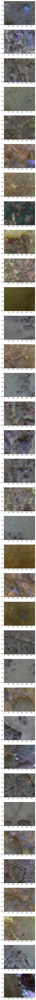

In [13]:
imgs = load_images(cluster_indexes[0], ls_fnames)
display(imgs)

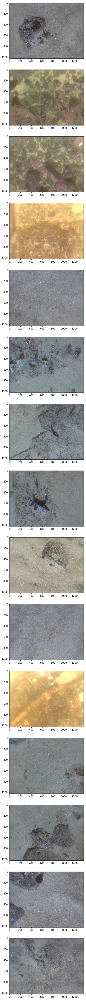

In [14]:
imgs = load_images(cluster_indexes[1], ls_fnames)
display(imgs)